In [32]:
# Load the libraries
import spatialdata as sd
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from easydecon.easydecon import *
from easydecon.config import *
from easydecon.extra import *
from spatialdata_plot.pl.utils import set_zero_in_cmap_to_transparent
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from easydecon.segmentation import run_bin2cell_segmentation

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.patches as patches


pd.set_option('display.max_rows', 100)

In [225]:
%reload_ext autoreload
%autoreload 2
from easydecon.easydecon import *
from easydecon.extra import *
test_function()

Easydecon loaded!
Test function executed!


In [226]:
set_n_jobs(5)
set_batch_size(1000)

In [227]:
# load a compatible color map for the spatial data
new_cmap = set_zero_in_cmap_to_transparent(cmap="viridis")


anndata.py (1756): Variable names are not unique. To make them unique, call `.var_names_make_unique`.
anndata.py (1756): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.
effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


2025-10-08 01:35:02.127831: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
100%|██████████████████████████████████████████████████████| 16/16 [1:57:53<00:00, 442.11s/it]


Found 262109 objects
Outputs saved:
  HE TIFF: stardist/tonsil.he.tiff
  Labels NPZ: stardist/tonsil.he.npz
  PDF plot: tonsil_bincounts.pdf
  H5AD: tonsil_bin2cell.h5ad


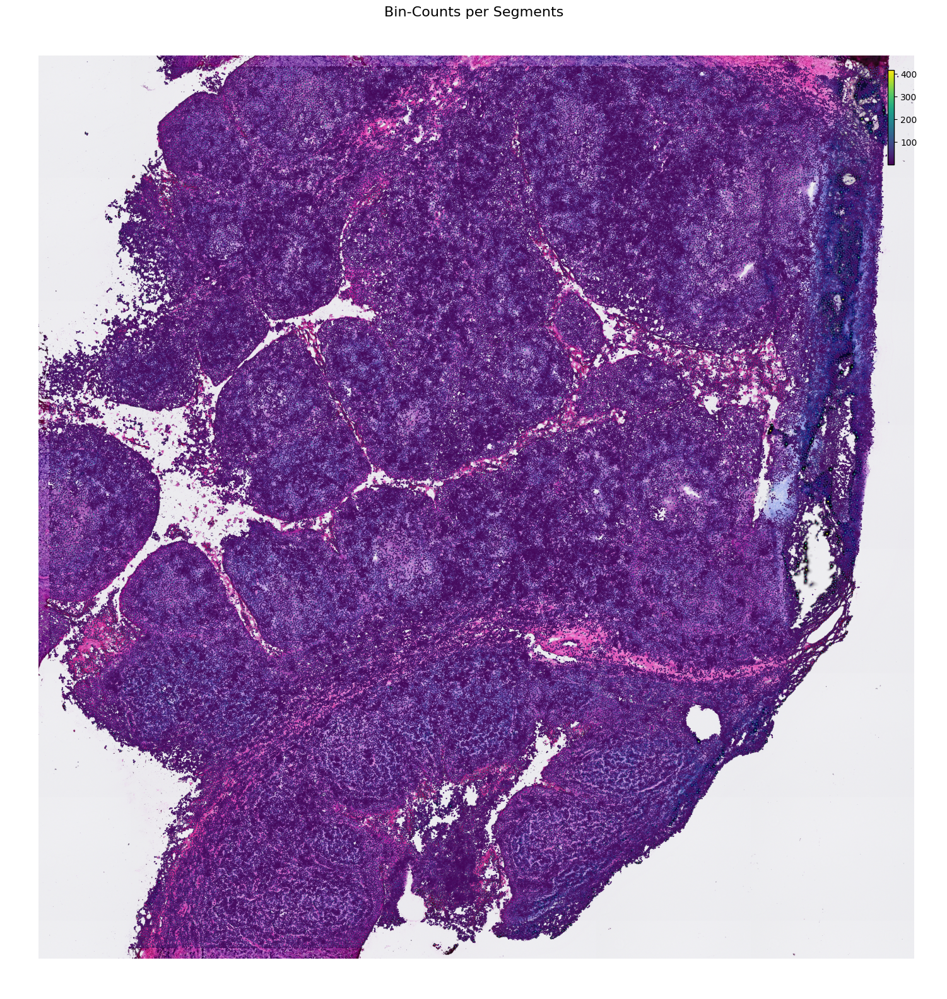

In [7]:
sample_id="tonsil"

#adjust directories based on your own dataset, both GPU and CPU should work for segmentation. Apple Silicon is also compatible with the correct version.
cdata=run_bin2cell_segmentation(sample_id=sample_id,binned_002="/projects/ec56/projects/visiumhd/tonsil/binned_outputs/square_002um",
                                full_image="/fp/projects01/ec56/projects/visiumhd/tonsil/Visium_HD_FF_Human_Tonsil_tissue_image.tif",
                                spaceranger_image_path="/projects/ec56/projects/visiumhd/tonsil/binned_outputs/square_002um/spatial/",
                                device="cpu", #you may select GPU if available but CPU should be enough,
                                prob_thresh=0.01, #decrease to detect more cells, can take more time
                                min_cells=0, #this is initial filtering, you may increase to decrease runtime
                                min_counts=0 #this is initial filtering, you may increase to decrease runtime
                                )

In [228]:
#we selected the top20 markers since AUC values are decaying, no need to use a larger set of markers.
#we created the deseq table using bioconductor scran.
markers_df_top20auc=read_markers_dataframe(cdata,filename="/projects/ec56/projects/visiumhd/notebooks/tonsil_epithelial.csv",top_n_genes=20,sort_by_column='summary.AUC')

Unique cell types detected in the dataframe:
['Crypt' 'Outer surface' 'VEGFA+' 'FDCSP epithelium' 'Surface epithelium'
 'Basal cells']


In [229]:
markers_df_top20auc.head()

,group,names,p.value,FDR,summary.AUC,AUC.VEGFA.,AUC.Surface.epithelium,AUC.Outer.surface,AUC.Crypt,AUC.FDCSP.epithelium,AUC.Basal.cells
group,,,,,,,,,,,
Crypt,Crypt,S100A6,0.000005,0.035652,0.974074,0.936364,0.777515,0.974074,NaN,0.910987,0.895665
Crypt,Crypt,TMSB10,0.000007,0.035652,0.966667,0.962121,0.876923,0.966667,NaN,0.906815,0.890522
Crypt,Crypt,CRIP1,0.000270,0.930159,0.877778,0.922727,0.742012,0.877778,NaN,0.831711,0.818516
Outer surface,Outer surface,C15orf48,0.002503,1.000000,0.790909,1.000000,0.779528,NaN,0.855556,0.790909,0.871345
Outer surface,Outer surface,LCN2,0.007478,1.000000,0.708661,1.000000,0.708661,NaN,0.788889,0.745455,0.807018


## We will use the fast workflow this time, phase 1, phase 2, proportion estimation and assignment are all included

In [230]:
phase1_result, phase2_result, assigned_labels, posterior_df, proportions_df= easydecon_workflow(cdata,marker_genes=["EPCAM", "KRT8", "KRT18", "KRT19", "KRT5", "KRT14", "CDH1","KRT8", "KRT18", "KRT19", "MUC1",
                                                                                                                    "MUC4", "SPIB", "GP2","KRT5", "KRT14", "KRT10", "IVL", "DSG1", "DSC1"],
                                                           markers_df=markers_df_top20auc,method="wjaccard",similarity_by_column="summary.AUC",allow_multiple=True)

Subsample 25000/25000 for MarkerGroup: 100%|█████████████████████████████████████████████| 1000/1000 [00:01<00:00, 503.53it/s]


Adding results to table.obs of sdata object
Processing spots with MarkerGroup != 0
Number of threads used: 5
Batch size: 1000


/fp/homes01/u01/ec-sinanuu/miniconda3/envs/easydecon_tensor/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/fp/homes01/u01/ec-sinanuu/miniconda3/envs/easydecon_tensor/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/fp/homes01/u01/ec-sinanuu/miniconda3/envs/easydecon_tensor/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources i

Adding results to table.obs of sdata object
Regular workflow, phase 1 used to find most likely postions and phase 2 to assign labels
Adding results to table.obs of sdata object
Processing spots with MarkerGroup != 0
Running deconvolution with parallel processing...
Normalization method: unit
Number of threads used: 5
Running deconvolution with method='nnls', alpha=0.01...


100%|█████████████████████████████████████████████████████████████████████████████████| 28390/28390 [00:05<00:00, 5050.83it/s]


Deconvolution completed.
Finished!
Posterior df and proportions can be None if the required columns or input parameters missing...


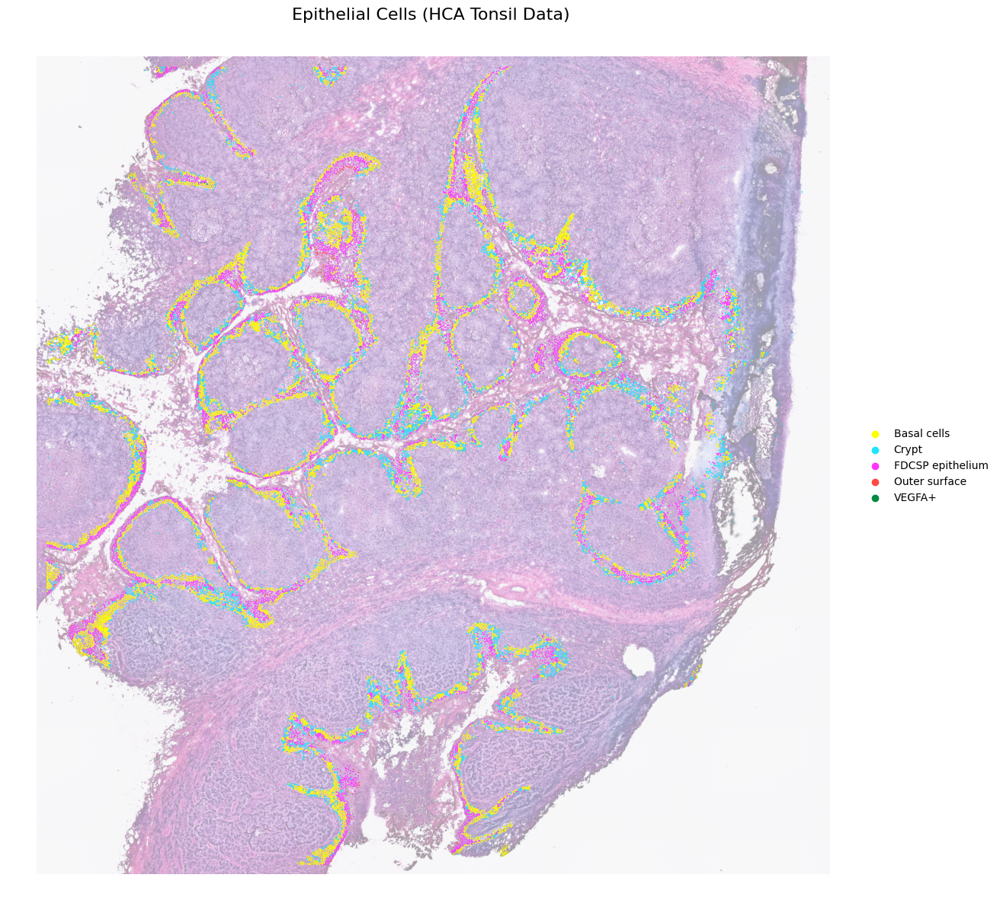

In [224]:
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust figure size as needed

sc.pl.spatial(cdata, color=["easydecon"
                            ], img_key="0.5_mpp", basis="spatial_cropped",ax=ax,show=False,na_in_legend=False,colorbar_loc=None,alpha_img=0.4)


ax.set_title('Epithelial Cells (HCA Tonsil Data)', fontsize=16)

ax.axis('off')

plt.savefig(f"{sample_id}_tonsil_atlas_epi.pdf", dpi=300)
plt.show()